# Library Importation

In [0]:
import csv
from pyspark import SparkContext, SparkConf
from pyspark.sql.session import  SparkSession
from operator import  add
from pyspark.sql.functions import *
from pyspark.sql.functions import row_number, col, split, explode, regexp_replace, count, when, to_date 
from pyspark.sql import Row
from pyspark.sql.window import Window
from pyspark.sql.types import FloatType


conf = SparkConf().setAppName('CourseWork').setMaster('local[*]')
sc = SparkContext.getOrCreate(conf=conf)

spark = SparkSession(sc)


# Data Cleaning and Preparation

In [0]:
file_locations = {
    'clinicaltrial_2020': '/FileStore/tables/clinicaltrial_2020.csv',
    'clinicaltrial_2021': '/FileStore/tables/clinicaltrial_2021.csv',
    'clinicaltrial_2023': '/FileStore/tables/clinicaltrial_2023.csv',
    'pharma': '/FileStore/tables/pharma.csv'
}

dataframes = {}

In [0]:
# Configuration for clinicaltrial_2020 and clinicaltrial_2021
for data in ['clinicaltrial_2020', 'clinicaltrial_2021']:
    dataframes[data] = spark.read.format('csv') \
        .option('sep', '|') \
        .option('header', True) \
        .load(file_locations[data])

In [0]:
# Read the raw CSV data as text file
raw_data = spark.read.text(file_locations['clinicaltrial_2023'])

In [0]:
raw_data.show(5)

+--------------------+
|               value|
+--------------------+
|"Id\tStudy Title\...|
|"NCT03630471\tEff...|
|"NCT05992571\tOra...|
|"NCT00237471\tImp...|
|"NCT03820271\tNew...|
+--------------------+
only showing top 5 rows



In [0]:
# Define a custom function to clean and split each line
def clean_and_split(line,  fill_missing=False):
    # Replace double quotes with an empty string
    cleaned_line = line.replace('"', '')

    # Remove trailing commas
    cleaned_line = cleaned_line.rstrip(',')

    # Split the line using tabs
    fields = cleaned_line.split('\t')
    
     # Fill missing values if required
    if fill_missing:
        while len(fields) < 14:  # Adjust the number as needed
            fields.append("N/A")  # Or any other appropriate placeholder

    return fields



In [0]:
# Apply the custom function to clean and split each line
cleaned_data = raw_data.rdd.map(lambda x: clean_and_split(x[0], fill_missing=True))

In [0]:
# Extract header from the first row
header = cleaned_data.first()

In [0]:
# Create a DataFrame with the expected schema
clinicaltrial_2023 = spark.createDataFrame(cleaned_data)

In [0]:
# Check for missing values
clinicaltrial_2023.select([count(when(isnan(c) | col(c).isNull(), c)).alias(c) for c in clinicaltrial_2023.columns]).show()

+---+---+---+---+---+---+---+---+---+---+---+---+---+---+
| _1| _2| _3| _4| _5| _6| _7| _8| _9|_10|_11|_12|_13|_14|
+---+---+---+---+---+---+---+---+---+---+---+---+---+---+
|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|  0|
+---+---+---+---+---+---+---+---+---+---+---+---+---+---+



In [0]:
# Create a DataFrame excluding the header
clinicaltrial_2023 = cleaned_data.filter(lambda row: row != header).toDF(header)

In [0]:
clinicaltrial_2023.printSchema()

root
 |-- Id: string (nullable = true)
 |-- Study Title: string (nullable = true)
 |-- Acronym: string (nullable = true)
 |-- Status: string (nullable = true)
 |-- Conditions: string (nullable = true)
 |-- Interventions: string (nullable = true)
 |-- Sponsor: string (nullable = true)
 |-- Collaborators: string (nullable = true)
 |-- Enrollment: string (nullable = true)
 |-- Funder Type: string (nullable = true)
 |-- Type: string (nullable = true)
 |-- Study Design: string (nullable = true)
 |-- Start: string (nullable = true)
 |-- Completion: string (nullable = true)



In [0]:
# Cast Enrollment column to float
clinicaltrial_2023 = clinicaltrial_2023.withColumn("Enrollment", clinicaltrial_2023["Enrollment"].cast(FloatType()))
# Cast Start and Completion columns to date
clinicaltrial_2023 = clinicaltrial_2023.withColumn("Start", to_date("Start"))
clinicaltrial_2023 = clinicaltrial_2023.withColumn("Completion", to_date("Completion"))

# Print the schema to verify the changes
clinicaltrial_2023.printSchema()


root
 |-- Id: string (nullable = true)
 |-- Study Title: string (nullable = true)
 |-- Acronym: string (nullable = true)
 |-- Status: string (nullable = true)
 |-- Conditions: string (nullable = true)
 |-- Interventions: string (nullable = true)
 |-- Sponsor: string (nullable = true)
 |-- Collaborators: string (nullable = true)
 |-- Enrollment: float (nullable = true)
 |-- Funder Type: string (nullable = true)
 |-- Type: string (nullable = true)
 |-- Study Design: string (nullable = true)
 |-- Start: date (nullable = true)
 |-- Completion: date (nullable = true)



In [0]:
pharma = spark.read.format('csv')\
     .option('sep', ',')\
     .option('header', True)\
     .load(file_locations['pharma'])

In [0]:
pharma.printSchema()

root
 |-- Company: string (nullable = true)
 |-- Parent_Company: string (nullable = true)
 |-- Penalty_Amount: string (nullable = true)
 |-- Subtraction_From_Penalty: string (nullable = true)
 |-- Penalty_Amount_Adjusted_For_Eliminating_Multiple_Counting: string (nullable = true)
 |-- Penalty_Year: string (nullable = true)
 |-- Penalty_Date: string (nullable = true)
 |-- Offense_Group: string (nullable = true)
 |-- Primary_Offense: string (nullable = true)
 |-- Secondary_Offense: string (nullable = true)
 |-- Description: string (nullable = true)
 |-- Level_of_Government: string (nullable = true)
 |-- Action_Type: string (nullable = true)
 |-- Agency: string (nullable = true)
 |-- Civil/Criminal: string (nullable = true)
 |-- Prosecution_Agreement: string (nullable = true)
 |-- Court: string (nullable = true)
 |-- Case_ID: string (nullable = true)
 |-- Private_Litigation_Case_Title: string (nullable = true)
 |-- Lawsuit_Resolution: string (nullable = true)
 |-- Facility_State: string (

In [0]:
print(dataframes.keys())

dict_keys(['clinicaltrial_2020', 'clinicaltrial_2021'])


In [0]:
# Show DataFrames
for data, df in dataframes.items():
    print(f"file for {data}:")
    df.show()

file for clinicaltrial_2020:
+-----------+--------------------+--------------------+--------+----------+--------------------+----------+--------------------+--------------------+
|         Id|             Sponsor|              Status|   Start|Completion|                Type|Submission|          Conditions|       Interventions|
+-----------+--------------------+--------------------+--------+----------+--------------------+----------+--------------------+--------------------+
|NCT02758028|The University of...|          Recruiting|Aug 2005|  Nov 2021|      Interventional|  Apr 2016|                NULL|                NULL|
|NCT02751957|     Duke University|           Completed|Jul 2016|  Jul 2020|      Interventional|  Apr 2016|Autistic Disorder...|                NULL|
|NCT02758483|Universidade Fede...|           Completed|Mar 2017|  Jan 2018|      Interventional|  Apr 2016|   Diabetes Mellitus|                NULL|
|NCT02759848|Istanbul Medeniye...|           Completed|Jan 2012|  Dec 2

In [0]:
# Show the first 10 rows
clinicaltrial_2023.show()

+-----------+--------------------+----------+------------------+--------------------+--------------------+--------------------+--------------------+----------+-----------+--------------+--------------------+----------+----------+
|         Id|         Study Title|   Acronym|            Status|          Conditions|       Interventions|             Sponsor|       Collaborators|Enrollment|Funder Type|          Type|        Study Design|     Start|Completion|
+-----------+--------------------+----------+------------------+--------------------+--------------------+--------------------+--------------------+----------+-----------+--------------+--------------------+----------+----------+
|NCT03630471|Effectiveness of ...|     PRIDE|         COMPLETED|Mental Health Iss...|BEHAVIORAL: PRIDE...|             Sangath|Harvard Medical S...|     250.0|      OTHER|INTERVENTIONAL|Allocation: RANDO...|2018-08-20|2019-02-28|
|NCT05992571|Oral Ketone Monoe...|          |        RECRUITING|Cerebrovascular 

In [0]:
# Displaying DataFrames
for data, df in dataframes.items():
    print(f"DataFrame for {data}:")
    display(df)

DataFrame for clinicaltrial_2020:


Id,Sponsor,Status,Start,Completion,Type,Submission,Conditions,Interventions
NCT02758028,The University of Hong Kong,Recruiting,Aug 2005,Nov 2021,Interventional,Apr 2016,null,null
NCT02751957,Duke University,Completed,Jul 2016,Jul 2020,Interventional,Apr 2016,"Autistic Disorder,Autism Spectrum Disorder",null
NCT02758483,Universidade Federal do Rio de Janeiro,Completed,Mar 2017,Jan 2018,Interventional,Apr 2016,Diabetes Mellitus,null
NCT02759848,Istanbul Medeniyet University,Completed,Jan 2012,Dec 2014,Observational,May 2016,"Tuberculosis,Lung Diseases,Pulmonary Disease",null
NCT02758860,University of Roma La Sapienza,"Active, not recruiting",Jun 2016,Sep 2020,Observational [Patient Registry],Apr 2016,"Diverticular Diseases,Diverticulum,Diverticulosis",null
NCT02757209,Consorzio Futuro in Ricerca,Completed,Apr 2016,Jan 2018,Interventional,Apr 2016,Asthma,"Fluticasone,Xhance,Budesonide,Formoterol Fumarate,Salmeterol Xinafoate"
NCT02752438,Ankara University,Unknown status,May 2016,Jul 2017,Observational [Patient Registry],Apr 2016,Hypoventilation,null
NCT02753543,Ruijin Hospital,Unknown status,Nov 2015,Nov 2019,Interventional,Apr 2016,Lymphoma,null
NCT02757508,Washington University School of Medicine,Completed,Mar 2016,Jul 2017,Interventional,Apr 2016,null,Vitamins
NCT02753530,Orphazyme,Completed,Aug 2017,Jan 2021,Interventional,Apr 2016,Myositis,null


DataFrame for clinicaltrial_2021:


Id,Sponsor,Status,Start,Completion,Type,Submission,Conditions,Interventions
NCT02758028,The University of Hong Kong,Recruiting,Aug 2005,Nov 2021,Interventional,Apr 2016,null,null
NCT02751957,Duke University,Completed,Jul 2016,Jul 2020,Interventional,Apr 2016,"Autistic Disorder,Autism Spectrum Disorder",null
NCT02758483,Universidade Federal do Rio de Janeiro,Completed,Mar 2017,Jan 2018,Interventional,Apr 2016,Diabetes Mellitus,null
NCT02759848,Istanbul Medeniyet University,Completed,Jan 2012,Dec 2014,Observational,May 2016,"Tuberculosis,Lung Diseases,Pulmonary Disease",null
NCT02758860,University of Roma La Sapienza,"Active, not recruiting",Jun 2016,Sep 2020,Observational [Patient Registry],Apr 2016,"Diverticular Diseases,Diverticulum,Diverticulosis",null
NCT02757209,Consorzio Futuro in Ricerca,Completed,Apr 2016,Jan 2018,Interventional,Apr 2016,Asthma,"Fluticasone,Xhance,Budesonide,Formoterol Fumarate,Salmeterol Xinafoate"
NCT02752438,Ankara University,Unknown status,May 2016,Jul 2017,Observational [Patient Registry],Apr 2016,Hypoventilation,null
NCT02753543,Ruijin Hospital,Unknown status,Nov 2015,Nov 2019,Interventional,Apr 2016,Lymphoma,null
NCT02757508,Washington University School of Medicine,Completed,Mar 2016,Jul 2017,Interventional,Apr 2016,null,Vitamins
NCT02753530,Orphazyme,Completed,Aug 2017,Jan 2021,Interventional,Apr 2016,Myositis,null


In [0]:
display(clinicaltrial_2023)

Id,Study Title,Acronym,Status,Conditions,Interventions,Sponsor,Collaborators,Enrollment,Funder Type,Type,Study Design,Start,Completion
NCT03630471,Effectiveness of a Problem-solving Intervention for Common Adolescent Mental Health Problems in India,PRIDE,COMPLETED,"Mental Health Issue (E.G., Depression, Psychosis, Personality Disorder, Substance Abuse)",BEHAVIORAL: PRIDE 'Step 1' problem-solving intervention|BEHAVIORAL: Enhanced usual care,Sangath,Harvard Medical School (HMS and HSDM)|London School of Hygiene and Tropical Medicine,250.0,OTHER,INTERVENTIONAL,"Allocation: RANDOMIZED|Intervention Model: PARALLEL|Masking: DOUBLE (INVESTIGATOR, OUTCOMES_ASSESSOR)|Primary Purpose: TREATMENT",2018-08-20,2019-02-28
NCT05992571,Oral Ketone Monoester Supplementation and Resting-state Brain Connectivity,,RECRUITING,Cerebrovascular Function|Cognition,OTHER: Placebo|DIETARY_SUPPLEMENT: β-OHB,McMaster University,"Alzheimer's Society of Brant, Haldimand Norfolk, Hamilton Halton",30.0,OTHER,INTERVENTIONAL,"Allocation: RANDOMIZED|Intervention Model: CROSSOVER|Masking: TRIPLE (PARTICIPANT, INVESTIGATOR, OUTCOMES_ASSESSOR)|Primary Purpose: BASIC_SCIENCE",2023-10-25,2024-08-01
NCT00237471,Impact of Tight Glycaemic Control in Acute Myocardial Infarction,,TERMINATED,Myocardial Infarct|Hyperglycemia,DRUG: Insulin (tight blood glucose control),Melbourne Health,"National Health and Medical Research Council, Australia|Bristol-Myers Squibb",40.0,OTHER,INTERVENTIONAL,Allocation: RANDOMIZED|Intervention Model: PARALLEL|Masking: NONE|Primary Purpose: TREATMENT,2005-10-01,2006-05-01
NCT03820271,New Prognostic Predictive Models of Mortality of Decompensated Cirrhotic Patients Waiting for Liver Transplantation,SUPERMELD,RECRUITING,Decompensated Cirrhosis|Liver Transplantation,OTHER: SuperMELD,Assistance Publique - Hôpitaux de Paris,,500.0,OTHER,INTERVENTIONAL,Allocation: NA|Intervention Model: SINGLE_GROUP|Masking: NONE|Primary Purpose: OTHER,2020-10-01,2023-10-01
NCT06229171,"InTake Care: Development and Validation of an Innovative, Personalized Digital Health Solution for Medication Adherence Support in Cardiovascular Prevention",InTakeCare,NOT_YET_RECRUITING,Hypertension|Treatment Adherence and Compliance|Digital Health,OTHER: adherence support system based on a vocal assistant,Istituto Auxologico Italiano,Istituti Clinici Scientifici Maugeri SpA|Politecnico di Milano,206.0,OTHER,INTERVENTIONAL,Allocation: RANDOMIZED|Intervention Model: PARALLEL|Masking: NONE|Primary Purpose: OTHER,2024-10-01,2026-04-01
NCT02945371,Tailored Inhibitory Control Training to Reverse EA-linked Deficits in Mid-life,REV,COMPLETED,Smoking|Alcohol Drinking|Prescription Drug Abuse|Substance-Related Disorders|Oral Intake Reduced,BEHAVIORAL: Person-centered inhibitory control training|BEHAVIORAL: Active behavioral response training,University of Oregon,,103.0,OTHER,INTERVENTIONAL,Allocation: RANDOMIZED|Intervention Model: PARALLEL|Masking: SINGLE (PARTICIPANT)|Primary Purpose: PREVENTION,2014-09-01,2016-05-01
NCT01055171,Neuromodulation of Trauma Memories in PTSD & Alcohol Dependence,,COMPLETED,Alcohol Dependence|PTSD,DRUG: Propranolol|DRUG: Placebo,Medical University of South Carolina,National Institute on Alcohol Abuse and Alcoholism (NIAAA),44.0,OTHER,INTERVENTIONAL,"Allocation: RANDOMIZED|Intervention Model: PARALLEL|Masking: QUADRUPLE (PARTICIPANT, CARE_PROVIDER, INVESTIGATOR, OUTCOMES_ASSESSOR)|Primary Purpose: TREATMENT",2010-01-01,2012-08-01
NCT01125371,Computerized Brief Alcohol Intervention (BI) for Binge Drinking HIV At-Risk and Infected Women,,COMPLETED,Alcohol; Harmful Use|Binge Drinking|Risk Behavior|HIV Infection,BEHAVIORAL: Computerized brief alcohol intervention + IVR booster calls|BEHAVIORAL: Computerized brief alcohol intervention|BEHAVIORAL: Attention Control,Johns Hopkins University,National Institute on Alcohol Abuse and Alcoholism (NIAAA),439.0,OTHER,INTERVENTIONAL,"Allocation: RANDOMIZED|Intervention Model: PARALLEL|Masking: DOUBLE (INVESTIGATOR, OUTCOMES_ASSES

In [0]:
display(pharma)

Company,Parent_Company,Penalty_Amount,Subtraction_From_Penalty,Penalty_Amount_Adjusted_For_Eliminating_Multiple_Counting,Penalty_Year,Penalty_Date,Offense_Group,Primary_Offense,Secondary_Offense,Description,Level_of_Government,Action_Type,Agency,Civil/Criminal,Prosecution_Agreement,Court,Case_ID,Private_Litigation_Case_Title,Lawsuit_Resolution,Facility_State,City,Address,Zip,NAICS_Code,NAICS_Translation,HQ_Country_of_Parent,HQ_State_of_Parent,Ownership_Structure,Parent_Company_Stock_Ticker,Major_Industry_of_Parent,Specific_Industry_of_Parent,Info_Source,Notes
Abbott Laboratories,Abbott Laboratories,"$5,475,000",$0,"$5,475,000",2013,20131227,government-contracting-related offenses,False Claims Act and related,kickbacks and bribery,"Abbott Laboratories agreed to $5.475 million to resolve allegations that it violated the False Claims Act by paying kickbacks to induce doctors to implant the company's carotid, biliary and peripheral vascular products.",federal,agency action,Justice Department Civil Division,civil,null,null,null,null,null,null,null,null,null,null,null,USA,Illinois,publicly traded,ABT,pharmaceuticals,pharmaceuticals,https://www.justice.gov/opa/pr/abbott-laboratories-pays-us-5475-million-settle-claims-company-paid-kickbacks-physicians,null
Abbott Laboratories Inc.,AbbVie,"$1,500,000,000",$0,"$1,500,000,000",2012,20120507,healthcare-related offenses,off-label or unapproved promotion of medical products,null,Global Health Care Company Abbott Laboratories Inc. has pleaded guilty and agreed to pay $1.5 billion to resolve its criminal and civil liability arising from the company's unlawful promotion of the prescription drug Depakote for uses not approved as safe and effective by the Food and Drug Administration. The resolution - the second largest payment by a drug company - includes a criminal fine and forfeiture totaling $700 million and civil settlements with the federal government and the states totaling $800 million. Abbott also will be subject to court-supervised probation and reporting obligations for Abbotts CEO and Board of Directors.,federal,agency action,Food and Drug Administration referral to the Justice Department,civil and criminal,null,null,null,null,null,null,null,null,null,null,null,USA,Illinois,publicly traded,ABBV,pharmaceuticals,pharmaceuticals,http://www.justice.gov/opa/pr/abbott-labs-pay-15-billion-resolve-criminal-civil-investigations-label-promotion-depakote,null
Abbott Laboratories Inc.,AbbVie,"$126,500,000",$0,"$126,500,000",2010,20101207,government-contracting-related offenses,False Claims Act and related,null,"Abbott Laboratories Inc., B. Braun Medical Inc. and Roxane Laboratories Inc. n/k/a Boehringer Ingelheim Roxane Inc. and affiliated entities agreed to pay $421 million to settle False Claims Act allegations, that they engaged in a scheme to report false and inflated prices for numerous pharmaceutical products knowing that federal healthcare programs relied on those reported prices to set payment rates.",federal,agency action,Justice Department Civil Division,civil,null,null,null,null,null,null,null,null,null,null,null,USA,Illinois,publicly traded,ABBV,pharmaceuticals,pharmaceuticals,https://www.justice.gov/opa/pr/pharmaceutical-manufacturers-pay-4212-million-settle-false-claims-act-cases,null
"Abbott Laboratories Puerto Rico, Inc.",Abbott Laboratories,"$49,045",$0,"$49,045",2009,20090305,employment-related offenses,wage and hour violation,Fair Labor Standards Act,null,federal,agency action,Labor Department Wage and Hour Division,civil,null,null,1527129,null,null,Puerto Rico,San Juan,null,null,423450,"423450: Medical, Dental, and Hospital Equipment and Supplies Merchant Wholesalers",USA,Illinois,publicly traded,ABT,pharmaceuticals,pharmaceuticals,"March 7, 2017 download of a dataset posted by the Wage and Hour Division at https://enforcedata.dol.gov/views/data_summary.php","Date and year are the Findings End Date in the dataset posted by the Wage and Hour Division, which does not provide ca

In [0]:
[c for c in clinicaltrial_2023.columns]

['Id',
 'Study Title',
 'Acronym',
 'Status',
 'Conditions',
 'Interventions',
 'Sponsor',
 'Collaborators',
 'Enrollment',
 'Funder Type',
 'Type',
 'Study Design',
 'Start',
 'Completion']

In [0]:
[c for c in pharma.columns]

['Company',
 'Parent_Company',
 'Penalty_Amount',
 'Subtraction_From_Penalty',
 'Penalty_Amount_Adjusted_For_Eliminating_Multiple_Counting',
 'Penalty_Year',
 'Penalty_Date',
 'Offense_Group',
 'Primary_Offense',
 'Secondary_Offense',
 'Description',
 'Level_of_Government',
 'Action_Type',
 'Agency',
 'Civil/Criminal',
 'Prosecution_Agreement',
 'Court',
 'Case_ID',
 'Private_Litigation_Case_Title',
 'Lawsuit_Resolution',
 'Facility_State',
 'City',
 'Address',
 'Zip',
 'NAICS_Code',
 'NAICS_Translation',
 'HQ_Country_of_Parent',
 'HQ_State_of_Parent',
 'Ownership_Structure',
 'Parent_Company_Stock_Ticker',
 'Major_Industry_of_Parent',
 'Specific_Industry_of_Parent',
 'Info_Source',
 'Notes']

In [0]:
try:
    # Save the DataFrame as a CSV file
    clinicaltrial_2023.write.csv("/FileStore/tables/clinicaltrial1_2023.csv")
    print("CSV file saved successfully!")
except Exception as e:
    print("Already saved:", e)

Already saved: [PATH_ALREADY_EXISTS] Path dbfs:/FileStore/tables/clinicaltrial1_2023.csv already exists. Set mode as "overwrite" to overwrite the existing path. SQLSTATE: 42K04


## PROBLEM ANSWERS

## QUESTION 1
The number of studies in the dataset.

In [0]:
# Perform distinct count on the 'column_name' column
distinct_count = clinicaltrial_2023.select(clinicaltrial_2023.columns[0]).distinct().count()

# Create a DataFrame with the count and a custom column name
distinct_count_df = spark.createDataFrame([Row(Distinct_Count=distinct_count)])

# Display the DataFrame with a custom name
distinct_count_df.show()

+--------------+
|Distinct_Count|
+--------------+
|        483422|
+--------------+



## QUESTION 2
List all the types (as contained in the Type column) of studies in the
dataset along with the frequencies of each type. These should be ordered from
most frequent to least frequent.

In [0]:
clinicaltrial_2023.groupBy(clinicaltrial_2023.Type).count()\
.orderBy('count', ascending=False)\
.show(5, truncate=False)

+---------------+------+
|Type           |count |
+---------------+------+
|INTERVENTIONAL |371382|
|OBSERVATIONAL  |110221|
|EXPANDED_ACCESS|928   |
|               |889   |
|N/A            |2     |
+---------------+------+



## QUESTION 3
The top 5 conditions (from Conditions) with their frequencies

In [0]:
# Assuming 'Conditions' is the column name where conditions are stored in clinicaltrial_2023
conditions_counts = clinicaltrial_2023\
    .select('Conditions').na.drop()\
    .select(split('Conditions', '\|').alias('Conditions'))\
    .withColumn('Individual_condition', explode('Conditions'))\
    .drop('Conditions')\
    .groupBy('Individual_condition').count()\
    .orderBy('count', ascending=False)\
    .withColumn('S/N', row_number().over(Window.orderBy(monotonically_increasing_id())))\
    .select(col('S/N'), col('Individual_condition') , col('count'))

In [0]:
# Getting the top 5 conditions by frequency
top_conditions = conditions_counts.limit(5)

In [0]:
# Displaying the results
top_conditions.show(truncate=False)

+---+--------------------+-----+
|S/N|Individual_condition|count|
+---+--------------------+-----+
|1  |Healthy             |9731 |
|2  |Breast Cancer       |7502 |
|3  |Obesity             |6549 |
|4  |Stroke              |4072 |
|5  |Hypertension        |4020 |
+---+--------------------+-----+



## QUESTION 4
10 most common sponsors that are not pharmaceutical companies + the number of clinical trials sponsored.

In [0]:
# Assuming 'Parent_Company' is the column name where pharmaceutical companies are stored in pharma DataFrame
parent = list(pharma.select('Parent_Company').toPandas()['Parent_Company'])

In [0]:
# Filter out clinical trials sponsored by pharmaceutical companies
filtered_trials = clinicaltrial_2023.select('Sponsor') \
    .filter(~col('Sponsor').isin(parent))

In [0]:
# Group by sponsors and count the number of trials they have sponsored
sponsor_counts = filtered_trials.groupBy('Sponsor').count()

In [0]:
# Exclude pharmaceutical companies from the top sponsors
top_non_pharma_sponsors = sponsor_counts.orderBy('count', ascending=False).limit(10)

In [0]:
# Display the results
top_non_pharma_sponsors.show(10, truncate=False)

+-------------------------------------------------------------+-----+
|Sponsor                                                      |count|
+-------------------------------------------------------------+-----+
|National Cancer Institute (NCI)                              |3410 |
|Assiut University                                            |3335 |
|Cairo University                                             |3023 |
|Assistance Publique - Hôpitaux de Paris                      |2951 |
|Mayo Clinic                                                  |2766 |
|M.D. Anderson Cancer Center                                  |2702 |
|Novartis Pharmaceuticals                                     |2393 |
|National Institute of Allergy and Infectious Diseases (NIAID)|2340 |
|Massachusetts General Hospital                               |2263 |
|National Taiwan University Hospital                          |2181 |
+-------------------------------------------------------------+-----+



## QUESTION 5
Creating Table and Visualization for Completed Studies

In [0]:
from pyspark.sql.functions import col, split, when
from matplotlib import pyplot as plt

In [0]:


# Assuming clinicaltrial_2023 is the DataFrame containing clinical trial data

# Filter and process the data
dataFrame = clinicaltrial_2023.select('Status', 'Completion').na.drop() \
    .filter(col('Status') == 'COMPLETED') \
    .withColumn('Month', split(col('Completion'), '-').getItem(1)) \
    .withColumn('Year', split(col('Completion'), '-').getItem(0)) \
    .filter(col('Year') == '2023') \
    .drop('Status', 'Completion', 'Year') \
    .groupBy('Month') \
    .count()

# Display the table
display(dataFrame)

Month,count
07,1360
11,909
01,1494
09,1152
05,1415
08,1230
03,1552
02,1272
06,1619
10,1058


In [0]:
# Display the table
dataFrame.show()

+-----+-----+
|Month|count|
+-----+-----+
|   07| 1360|
|   11|  909|
|   01| 1494|
|   09| 1152|
|   05| 1415|
|   08| 1230|
|   03| 1552|
|   02| 1272|
|   06| 1619|
|   10| 1058|
|   12| 1082|
|   04| 1324|
+-----+-----+



In [0]:
# Map month names to abbreviated forms
completed_studies = dataFrame.withColumn('Month_Name',
                                         when(col('Month') == '01', 'Jan') \
                                        .when(col('Month') == '02', 'Feb') \
                                        .when(col('Month') == '03', 'Mar') \
                                        .when(col('Month') == '04', 'Apr') \
                                        .when(col('Month') == '05', 'May') \
                                        .when(col('Month') == '06', 'Jun') \
                                        .when(col('Month') == '07', 'Jul') \
                                        .when(col('Month') == '08', 'Aug') \
                                        .when(col('Month') == '09', 'Sep') \
                                        .when(col('Month') == '10', 'Oct') \
                                        .when(col('Month') == '11', 'Nov') \
                                        .when(col('Month') == '12', 'Dec')
                                       )

In [0]:
# Sort the DataFrame by the numeric representation of months and overwrite the existing 'Month_Name' column
completed_studies = completed_studies.orderBy('Month', ascending=True) \
    .drop('Month')

In [0]:
# Display the sorted table
display(completed_studies)

count,Month_Name
1494,Jan
1272,Feb
1552,Mar
1324,Apr
1415,May
1619,Jun
1360,Jul
1230,Aug
1152,Sep
1058,Oct


In [0]:
# Plot the number of completed studies for each month
completed_studies = completed_studies.toPandas()

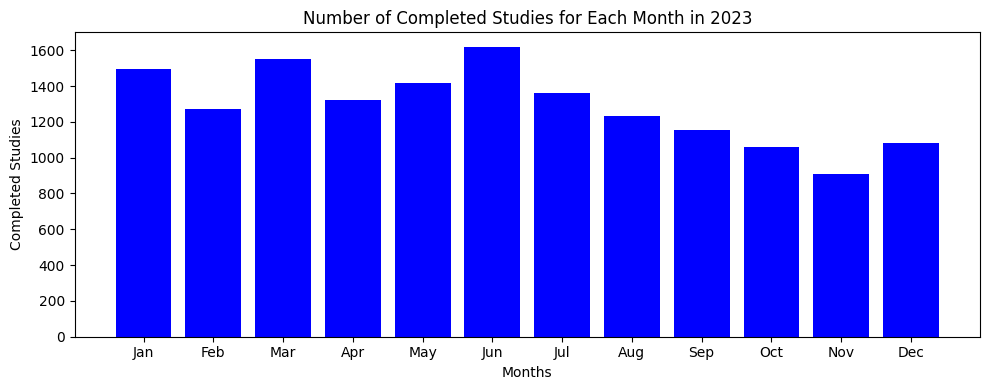

In [0]:
plt.figure(figsize=(10, 4))
plt.bar(completed_studies['Month_Name'], completed_studies['count'], color='blue')
plt.xlabel('Months')
plt.ylabel('Completed Studies')
plt.title('Number of Completed Studies for Each Month in 2023')
plt.tight_layout()
plt.show()

## EXTRA MARK
Comparison between the number of completed studies for 2020, 2021 and 2023

In [0]:
# Assuming clinicaltrial_2023 is the DataFrame containing clinical trial data

# Filter and process the data
Year_2023 = clinicaltrial_2023.select('Status', 'Completion').na.drop() \
    .filter(col('Status') == 'COMPLETED') \
    .withColumn('Month', split(col('Completion'), '-').getItem(1)) \
    .withColumn('Year', split(col('Completion'), '-').getItem(0)) \
    .filter(col('Year') == '2023') \
    .drop('Status', 'Completion', 'Month') \
    .groupBy('Year') \
    .count()

display(Year_2023)

Year,count
2023,15467


Visualization of the comparison of the number of Completed Studies between 2020, 2021, 2023.

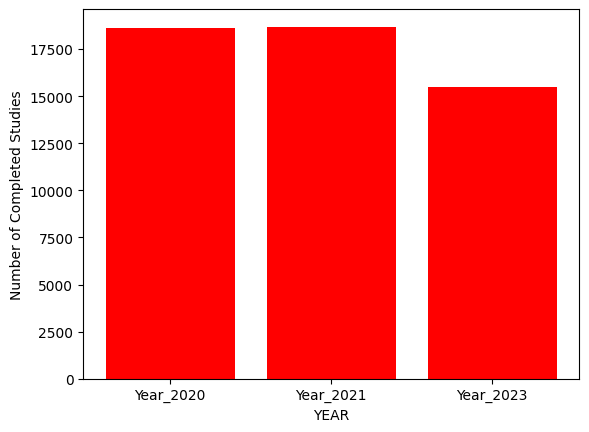

In [0]:
Completed_Studies = ['Year_2020', 'Year_2021', 'Year_2023']
count = [18615, 18689, 15467]
 
plt.bar (x = Completed_Studies, height = count, color = 'red')
plt.xlabel('YEAR')
plt.ylabel('Number of Completed Studies')
plt.show()

Counting the Status of the Year 2023

In [0]:
clinicaltrial_2023.groupBy('Status').count().show()

+--------------------+------+
|              Status| count|
+--------------------+------+
|           SUSPENDED|  1644|
|APPROVED_FOR_MARK...|   197|
|ENROLLING_BY_INVI...|  3937|
|           AVAILABLE|   259|
| NO_LONGER_AVAILABLE|   446|
|             UNKNOWN| 64813|
|          TERMINATED| 28022|
|  NOT_YET_RECRUITING| 20098|
|TEMPORARILY_NOT_A...|    26|
|          RECRUITING| 66158|
|           COMPLETED|263498|
|           WITHDRAWN| 13718|
|ACTIVE_NOT_RECRUI...| 19716|
|            WITHHELD|   889|
|      INTERVENTIONAL|     1|
+--------------------+------+

